# Artem Moskalev. LTI systems and Convolution

### Exercise 1 (5%)

Causal, linear, time-invariant?

a) $ T(y[n]) = \sum_{k=n0}^{n} y[k] $

b) $ T(y[n]) = exp(y[n]) $

c) $ T(y[n]) = ay[n] + b $

d) $ T(y[n]) = y[-n] $

e) $ T(y[n]) = y[n] + 3y[n+1] $

Answer: details are paper-based

a) Causal, linear, non time-invariant <br>
b) Causal, non-linear, time-invariant <br>
c) Causal, non-linear, time-invariant <br>
d) Non-causal, linear, time-invariant <br>
e) Non-causal, linear, time-invariant <br><br>

*Shift-Invariant will be more proper term

### Exercise 2 (5%)

By direct evaluation of the convolution sum, determine the step response of a linear time-invariant system whose impulse is 
 
$ h[n] = a^{-n} u[-n] $, where $ 0 < a < 1$ .

Answer: paper-baseed

### Exercise 3 (10%)

Determine and sketch the convolution of the following two signals:

$
x(t) = u(t-3) - u(t-5)$  and $h(t) = e^{-3t}u(t)$

Answer: paper-based

### Exercise 4 (10%)

Let the signal 

$$
y[n] = x[n] \ast h[n] ,
$$

where 

$$
x[n] = 3^n u[-n - 1] + \frac{1}{3}^n u[n]
$$

and 

$$
h[n] = \frac{1}{4}^n u[n + 3].
$$

Determine $ y[n] $ utilizing the **distributive property** of convolution.

Answer: paper-based

# Image Processing

The goal of this homework is to learn the basic terms of Image Processing using the convolution operation. Firstly, we will **denoise** the given images using Gaussian and Median filters and then will try to enhance the quality of the image by **sharpening** procedure. Your convolution function should be able to perform convolution on 2d signals. In the case of color images, you will perform the convolution on each channel.

Do not forget to discuss the results after every filtering step. 

## Denoising

### Gaussian filter

The convolution operation in 2D is defined as follows:

$$
y(i, j) = \int_{u=-\infty}^{\infty} \int_{u=-\infty}^{\infty} x(u, v) g(i - u, j - v)
$$

where $ g(u, v) $ could be any kernel, for example, Gaussian:

$$
g(u, v) = \frac{1}{2 \pi \sigma^2} \exp \bigg( -\frac{u^2 + v^2}{2 \sigma^2} \bigg)
$$

We will consider two types of noise:

- Gaussian noise
- Speckle noise

and will try to denoise images using Gaussian filter. (5%)

Your convolution function should not use any library function that computes convolution. 

In [1]:
# import the necessary modules
import numpy as np
import matplotlib.pyplot as plt
import skimage
from skimage import io

%matplotlib inline

In [2]:
def show_images(input_image, input_title, output_image, output_title, cmap=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 35))
    
    ax1.imshow(input_image, cmap=cmap)
    ax1.set_title(input_title)
    
    ax2.imshow(output_image, cmap=cmap)
    ax2.set_title(output_title)

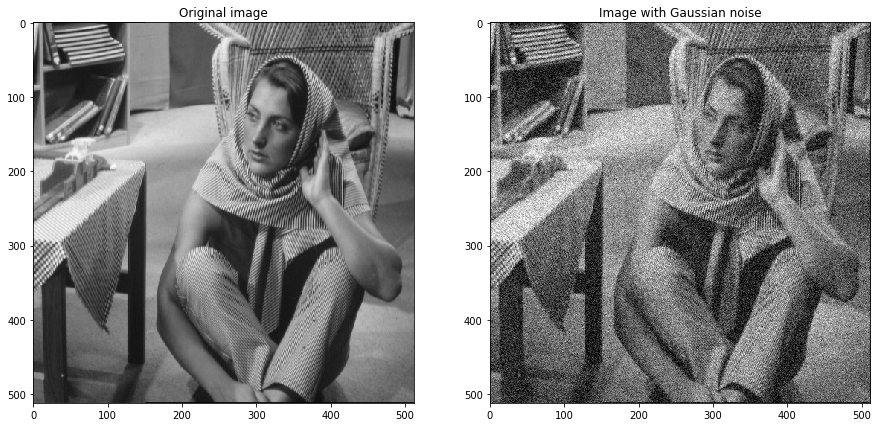

In [3]:
# read images
image_original_grey = io.imread('barbara_grey.png')
image_gaussian_grey = io.imread('barbara_grey_gaussian.png')

# imshow gallery
show_images(image_original_grey, 'Original image', image_gaussian_grey, 'Image with Gaussian noise', cmap='gray')

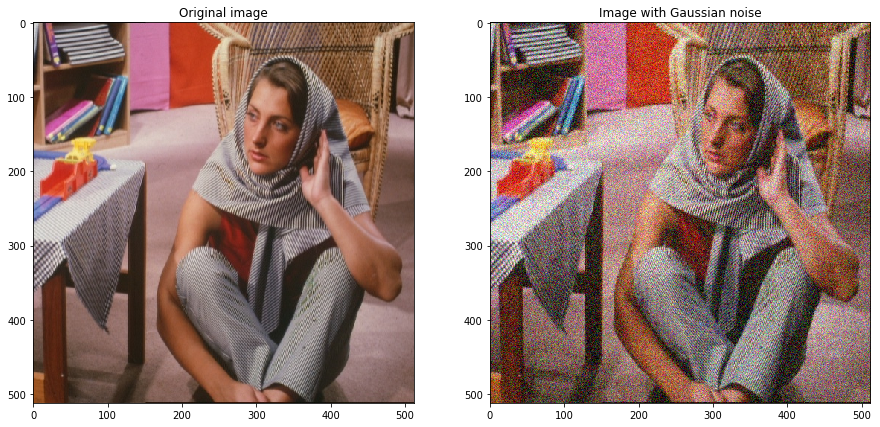

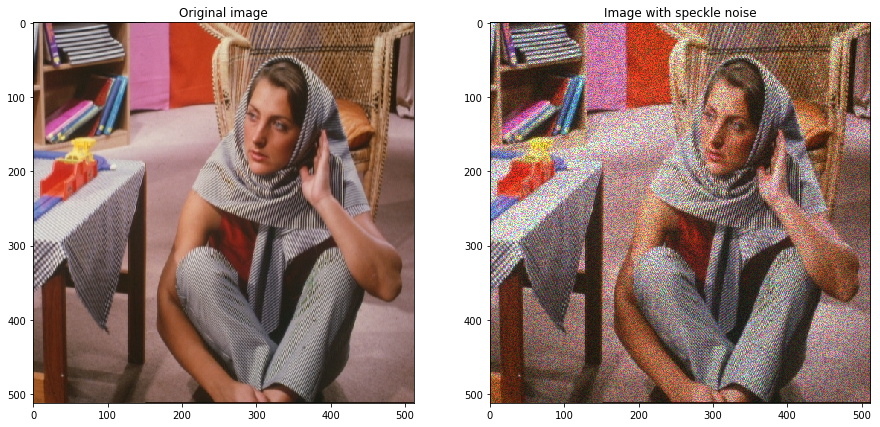

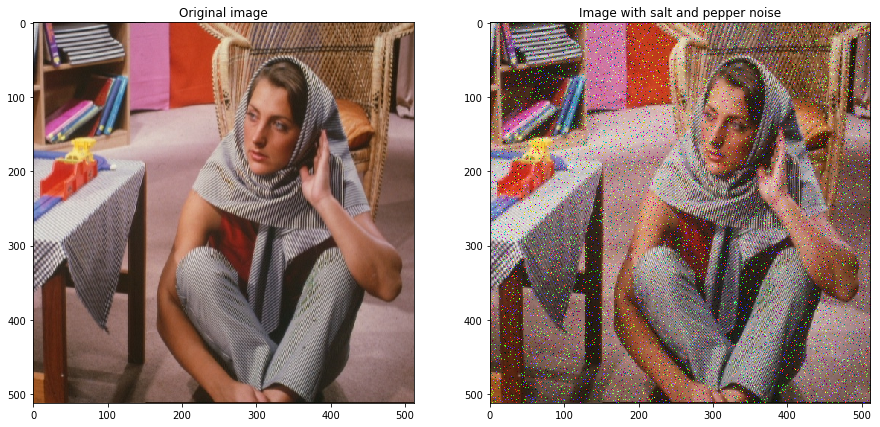

In [4]:
# read images
image_original = io.imread('barbara.png')
image_gaussian = io.imread('barbara_gaussian.png')
image_speckle = io.imread('barbara_speckle.png')
image_sp = io.imread('barbara_sp.png')

# imshow gallery
show_images(image_original, 'Original image', image_gaussian, 'Image with Gaussian noise')
show_images(image_original, 'Original image', image_speckle, 'Image with speckle noise')
show_images(image_original, 'Original image', image_sp, 'Image with salt and pepper noise')

<center> 
###### In the function below, I also added parameter 'median'. When selected it turns on the median kernel, in this case parameter 'median_radius' is responsible for kernel's radius.

In [5]:
# define the convolution function (35%)

def convolution_2d(image, kernel, mode, boundary, median=False, median_radius=3, separable = False):
    
    """
    - image: input image
    - kernel: filter kernel
    - mode: "same" or "valid"
    - boundary: "zero" or "periodic" (wrap), or "mirror"
    - median: turns on the median mode
    - median_radius: adjust the size of median kernel
    - separable: if True, apply median filter in a separable mode
    """
    
    # your code goes here 
    
    if image.ndim == 3: # colored
        d1, d2, d3 = image[:,:,0].copy(), image[:,:,1].copy(), image[:,:,2].copy() #512x512 each
    if image.ndim == 2: #gray
        d1 = image.copy()
        
    #assign padding by mode + fill padding according the boundary rule
    if median:
        if separable:
            kernel = np.ones(median_radius)
        else:
            kernel = np.ones((median_radius,median_radius))
        
    kernel_dim = kernel.shape[0]
    padding_size, image_width, image_height = int((kernel_dim - 1) / 2), image.shape[0], image.shape[1]
    
    def do_padding(d1, mode, boundary):
        if mode=='same':
            if boundary == 'zero':
                d1= np.pad(d1, padding_size, mode='constant')
            elif boundary == 'periodic':
                d1 = np.pad(d1, padding_size, mode='wrap')
            elif boundary == 'mirror':
                d1 = np.pad(d1, padding_size, mode='reflect')
            else:
                return "Boundary is incorrect, use 'zero', 'periodic' or 'mirror'."
        return d1
    
    d1 = do_padding(d1, mode = mode, boundary=boundary)
    
    if image.ndim == 3:
        d2, d3 = do_padding(d2, mode = mode, boundary=boundary), do_padding(d3, mode = mode, boundary=boundary)
    
    #conv 1. row convolution
    
    def kernel_1dim(d1, axis='row'):
        
        if axis == 'row':
            img_shape, width_or_height = d1.shape[0], d1.shape[1]
        elif axis == 'column':
            img_shape, width_or_height = d1.shape[1], d1.shape[0]

        for each_row_idx in range(img_shape):
            d1_current_convolved = list()
            
            if axis == 'row':
                current_row_d1 = np.copy(d1[each_row_idx,:])
            
            elif axis == 'column':
                current_row_d1 = np.copy(d1[:,each_row_idx])

            for i in range(0,width_or_height-kernel_dim+1):
                image_part_d1 = np.copy(current_row_d1[i:i+kernel_dim])
                if median:
                    convolved_element_d1 = np.median(image_part_d1)
                else:
                    convolved_element_d1 = np.sum(np.multiply(kernel, image_part_d1))
                d1_current_convolved.append(convolved_element_d1)
                                
            if each_row_idx==0:
                d1_convolved = np.array(d1_current_convolved)
            else:
                d1_convolved = np.vstack((d1_convolved, d1_current_convolved))
                        
        return d1_convolved
    
    def kernel_2dim(image, channel, kernel):
        
        if image.ndim == 3:
            convolved = np.zeros_like(image[:,:,0])
        elif image.ndim == 2:
            convolved = np.zeros_like(image)
        
        start_x, start_y = padding_size, padding_size
        stop_x, stop_y = channel.shape[0]-padding_size-1, channel.shape[1]-padding_size-1

        for i,x in enumerate(range(start_x, stop_x+1)):
            for j, y in enumerate(range(start_y, stop_y+1)):
                image_segment = np.copy(channel[x-1:x+2, y-1:y+2])
                if median:
                    convolved_element = np.median(image_segment)
                else:
                    convolved_element = np.sum(np.multiply(image_segment, kernel))
                convolved[i,j] = convolved_element
        return convolved
    
    if kernel.ndim == 1:
        if image.ndim == 3:
            d1_row_convolved = kernel_1dim(d1, axis = 'row')
            d2_row_convolved = kernel_1dim(d2, axis = 'row')
            d3_row_convolved = kernel_1dim(d3, axis = 'row')

            d1_col_convolved = kernel_1dim(d1_row_convolved, axis='column')
            d2_col_convolved = kernel_1dim(d2_row_convolved, axis='column')
            d3_col_convolved = kernel_1dim(d3_row_convolved, axis='column')
            return np.stack([d1_col_convolved.T,d2_col_convolved.T,d3_col_convolved.T], axis=2).astype("uint8")
            
        elif image.ndim == 2:
            d1_row_convolved = kernel_1dim(d1, axis = 'row')
            d1_col_convolved = kernel_1dim(d1_row_convolved, axis='column')
            return d1_col_convolved.T
        
    elif kernel.ndim == 2:
        if image.ndim == 3:
            d1_convolved = kernel_2dim(image, d1, kernel=kernel)
            d2_convolved = kernel_2dim(image, d2, kernel=kernel)
            d3_convolved = kernel_2dim(image, d3, kernel=kernel)
            return np.stack([d1_convolved,d2_convolved,d3_convolved], axis=2).astype("uint8")
        elif image.ndim == 2:
            d1_convolved = kernel_2dim(image, d1, kernel=kernel)
            return d1_convolved

In [6]:
# define the Gaussian kernel generating function (2.5%)

def gaussian_kernel_1d(sigma, radius):
    # your code goes here
    
    kernel = np.arange(0,radius,1)
    kernel = kernel - kernel.mean()
    
    gaussian = np.vectorize(lambda x: (2*np.pi*sigma**2)**(-1) * np.exp( -1*x**2 / (2*sigma**2)))
    kernel = gaussian(kernel)
    
    kernel = kernel / np.sum(kernel)
    
    return kernel

In [7]:
kernel_1d = gaussian_kernel_1d(20, 11)
imgg = convolution_2d(image=image_original, kernel=kernel_1d, mode='same', boundary='mirror')

###### Everywhere below, I varied sigma and radius parameters to achive the better results. I am not including the history of this variations to not overload the notebook.

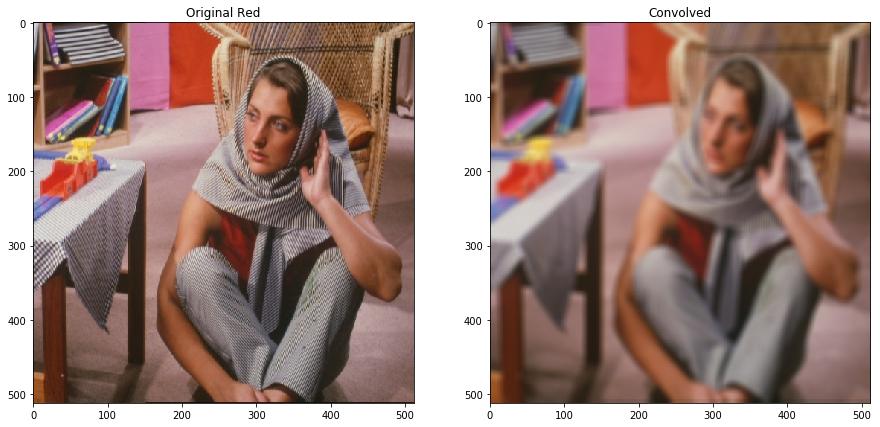

In [8]:
show_images(image_original,'Original Red' ,imgg, 'Convolved')

In [9]:
# define the compare_psnr function (2.5%)

def compare_psnr(input_img, reference_img):
    # your code goes here
    input_img = skimage.img_as_float(input_img)
    reference_img = skimage.img_as_float(reference_img)
    MSE = np.mean(np.square(input_img - reference_img))
    psnr = 20*np.log10(input_img.max()/np.sqrt(MSE))
    
    return psnr

In [10]:
from skimage.measure import compare_psnr as cmpsnr

Denoise the image, both grayscale and color, with ** Gaussian noise ** (same-size convolution and mirror boundary conditions, use separable Gaussian kernel):

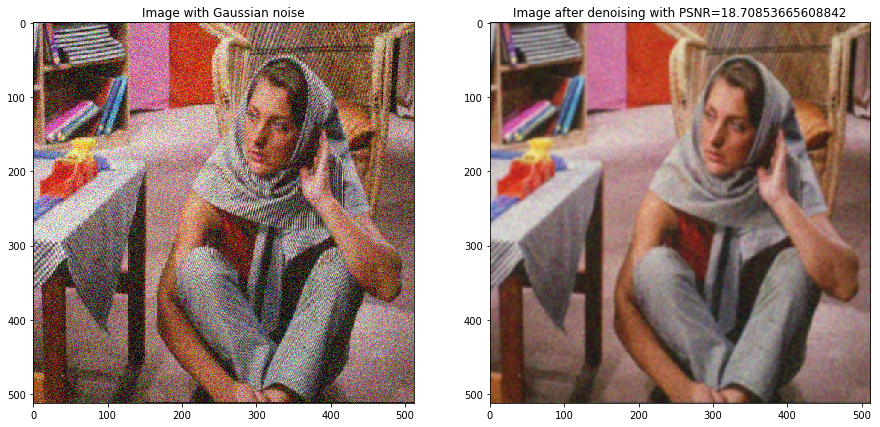

In [11]:
# your code goes here
# imshow input and output
input_image = image_gaussian

kernel_1d = gaussian_kernel_1d(2, 5)
output_image = convolution_2d(image=input_image, kernel=kernel_1d, mode='same', boundary='mirror')

psnr = compare_psnr(input_image, output_image)
show_images(input_image, 'Image with Gaussian noise', 
            output_image, 'Image after denoising with PSNR={0}'.format(psnr))

In [12]:
##### check psnr:
cmpsnr(input_image, output_image) #correct

18.70853665608842

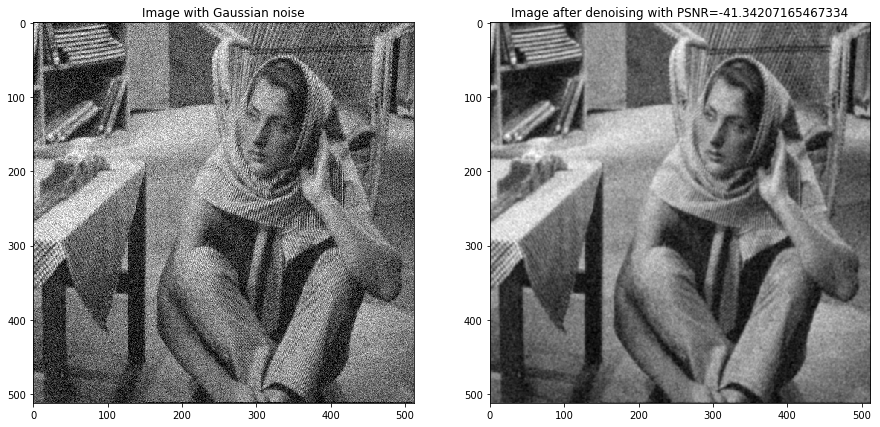

In [13]:
input_image = image_gaussian_grey

kernel_1d = gaussian_kernel_1d(1, 7)
output_image = convolution_2d(image=input_image, kernel=kernel_1d, mode='same', boundary='mirror')

psnr = compare_psnr(input_image, output_image)
show_images(input_image, 'Image with Gaussian noise', 
            output_image, 'Image after denoising with PSNR={0}'.format(psnr), cmap = 'gray')

Denoise the image with ** speckle noise ** (same-size convolution and periodic boundary conditions):

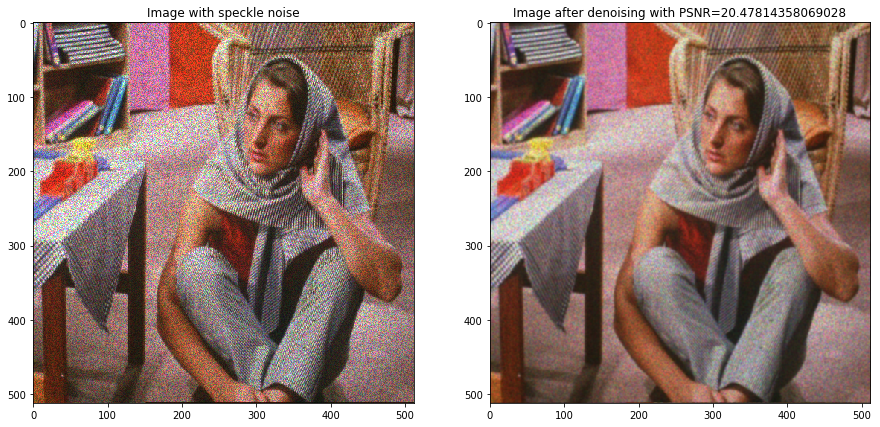

In [14]:
# your code goes here

# imshow input and output
input_image = image_speckle

kernel_1d = gaussian_kernel_1d(0.9, 11)
output_image = convolution_2d(image=input_image, kernel=kernel_1d, mode='same', boundary='periodic')

psnr = compare_psnr(input_image, output_image)
show_images(input_image, 'Image with speckle noise', 
            output_image, 'Image after denoising with PSNR={0}'.format(psnr))

Vary $ \sigma $ and filter radius to get better result.

### Median filter

Median filter assigns to the pixel of interest the median value of its neighborhood. It is ideal for salt & pepper noise removal. (10%)

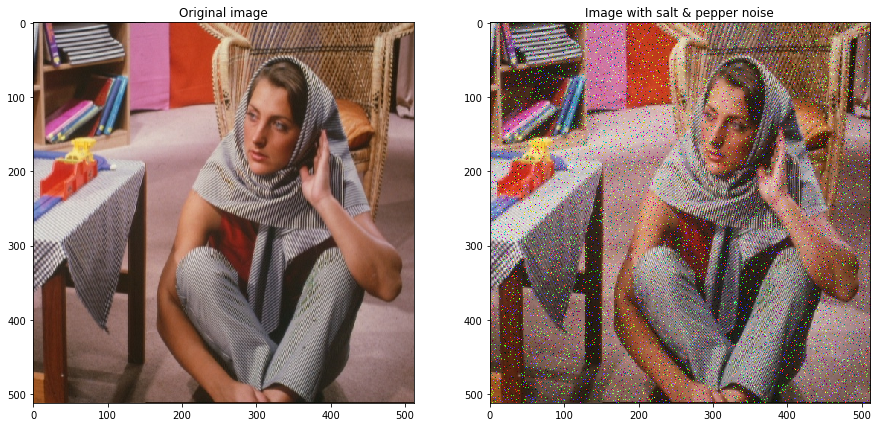

In [15]:
# read images

image_sp = io.imread('barbara_sp.png')

# imshow gallery
show_images(image_original, 'Original image', image_sp, 'Image with salt & pepper noise')

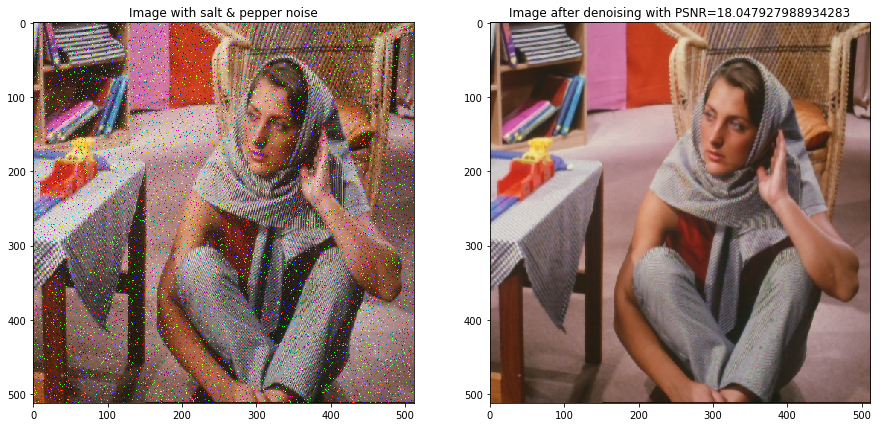

In [16]:
# your code goes here

# imshow input and output
input_image = image_sp
output_image = convolution_2d(image=input_image, kernel=3, mode='same', boundary='zero', median=True, median_radius=3) 

#put your result here
psnr = compare_psnr(input_image, output_image)
show_images(input_image, 'Image with salt & pepper noise', 
            output_image, 'Image after denoising with PSNR={0}'.format(psnr))

### Separable median filter (additional)

references: http://yanivresearch.info/writtenMaterial/median.pdf

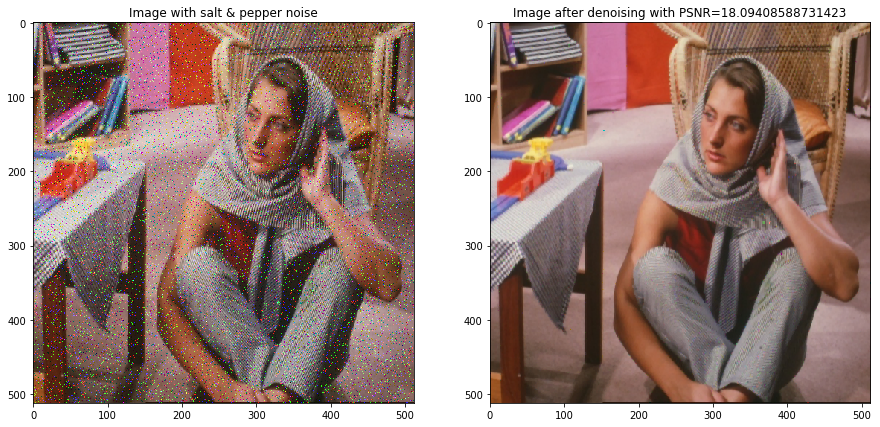

In [17]:
# your code goes here

# imshow input and output
input_image = image_sp
output_image = convolution_2d(image=input_image, kernel=3, mode='same', boundary='zero', median=True, median_radius=3, separable=True) 

#put your result here
psnr = compare_psnr(input_image, output_image)
show_images(input_image, 'Image with salt & pepper noise', 
            output_image, 'Image after denoising with PSNR={0}'.format(psnr))

##### As we see, in this particular case sepable median filter yeilds better results.

Vary the filter radius to get better result.

## Sharpening

### Laplacian operator

Sharpening is an opposite operation to image smoothing, where enhancing is obtained by adding the edges to the input image.

Let us consider Laplacian operator:

$$
\Delta y(u, v) = \frac{\partial^2 y(u, v)}{\partial^2 u} + \frac{\partial^2 y(u, v)}{\partial^2 v} .
$$

Sharpeing effect is reached by

$$
y_{sharp}(u, v) = y(u, v) + c \Delta y(u, v) ,
$$

where $ c $ is some constant. (5%)

In [18]:
kernel_cross = np.array([[0,1,0],[1,-4,1],[0,1,0]])
kernel_square = np.array([[1,1,1],[1,-8,1],[1,1,1]])

In [19]:
image_original_float = skimage.img_as_float(image_original)

In [30]:
Laplacian_convolved = convolution_2d(image_original_float, kernel=kernel_square, mode='same', boundary='mirror')

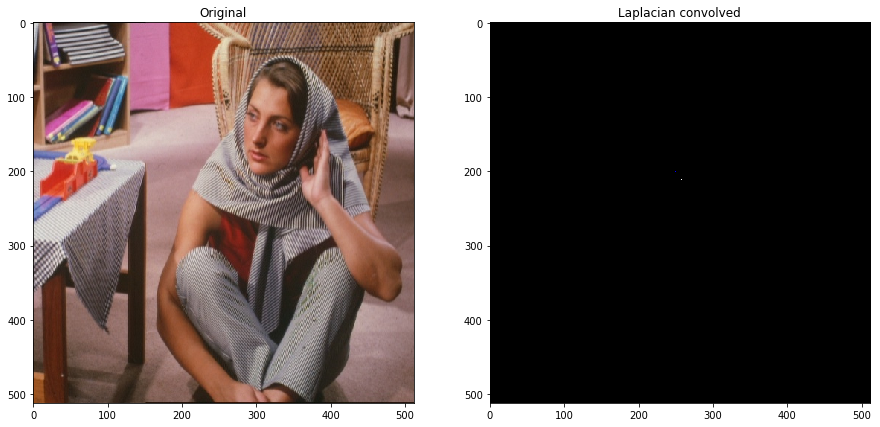

In [31]:
#Laplacian_convolved = skimage.img_as_float(Laplacian_convolved)
show_images(image_original, 'Original', Laplacian_convolved, 'Laplacian convolved')

In [22]:
Laplacian_convolved_float=skimage.img_as_float(Laplacian_convolved)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


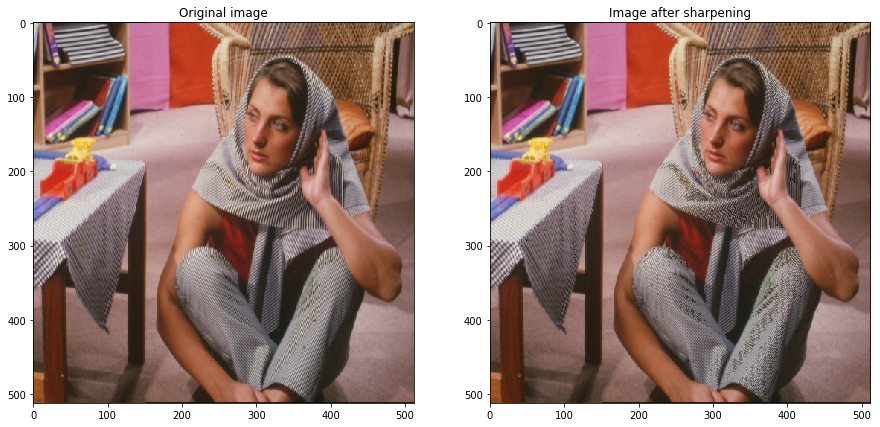

In [23]:
# you can use one of the popular Laplacian approximations (cross or square)

# your code goes here
sharpened = image_original_float - 0.35*Laplacian_convolved_float
# imshow input and output
input_image = image_original_float
output_image = sharpened # put your result here
show_images(input_image, 'Original image', output_image, 'Image after sharpening')

You can vary parameter $ c $ to obtain better result (you can start with $ c = -0.15 $) and compare the differences between different values.

### Unsharp mask

Implement Unsharp mask algorithm according to the lecture slides. (5%)

In [24]:
mask_1, mask_2 = np.zeros((3,3)), np.ones((3,3))/9
mask_1[1,1] = 2
unsharp_mask = mask_1-mask_2

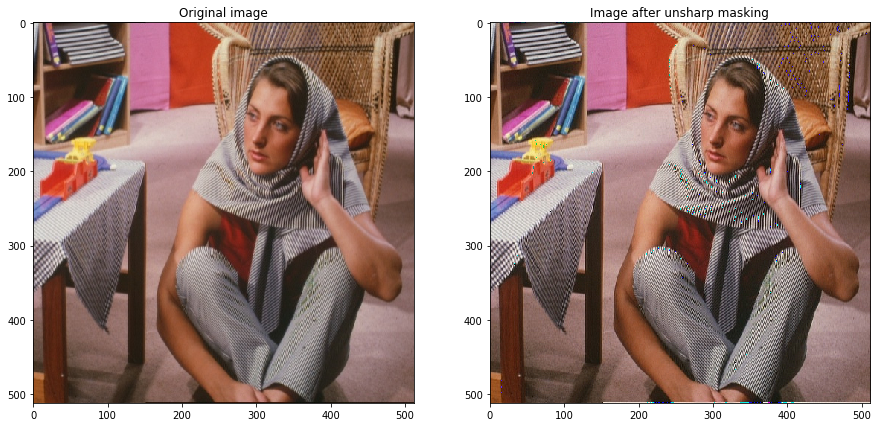

In [25]:
# your code goes here
input_image = image_original
output_image = convolution_2d(image_original, kernel=unsharp_mask, mode='same', boundary='mirror') # put your result here
show_images(input_image, 'Original image', output_image, 'Image after unsharp masking')

## Extra points

There is skimage.filters.laplace filter. Using signal and image processing techniques find out which kernel do they use. (5%)

Consider an image:

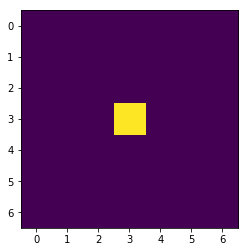

In [26]:
img = np.zeros((7,7), dtype = np.float32)
img[3,3] = 1.
plt.imshow(img);

In [27]:
from skimage.filters import laplace

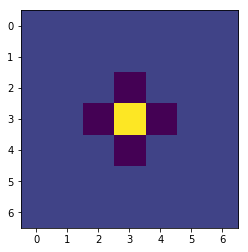

In [28]:
filtered = laplace(img)
plt.imshow(filtered);

In [29]:
filtered

array([[ 0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0., -1.,  0.,  0.,  0.],
       [ 0.,  0., -1.,  4., -1.,  0.,  0.],
       [ 0.,  0.,  0., -1.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.]])

We can see that skimage employs the following kernel: $K = \begin{pmatrix}
0 & -1 & 0\\
-1 & 4 & -1 \\
0 & -1 & 0
\end{pmatrix}$